## IMDB movie review sentiment analysis using DistilBERT

Advantages of DistilBERT over BERT:

DistilBERT hsa 40% less parameters than bert-base-uncased, runs 60% faster while preserving over 95% of BERT’s performances as measured on the GLUE language understanding benchmark.

SST-2 The corpus is based on the dataset introduced by Pang and Lee (2005) and consists of 11,855 single sentences extracted from movie reviews. 



#### Expected output from DistilBERT Model:

Sentiment polarity scores

Eg:  Prediction using DistilBERT on movie “Four weddings & a Funeral”


[0.1560576, 0.8439424]
class 1 has 84.39% probability therefore the prediction will be 1 (more Positive)


#### Biases & Limitations
For instance, for sentences like This film was filmed in COUNTRY, this binary classification model will give radically 
different probabilities for the positive label depending on the country (0.89 if the country is France, but different for other countries)
when nothing in the input indicates such a strong semantic shift.

In [1]:
import sys
import torch

import numpy as np
import random as rn
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt

# from tqdm import tqdm

import nltk
# For Text pre-processing
from word2number import w2n
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk import word_tokenize, pos_tag, pos_tag_sents

# Bert & Pytorch
from torch import nn
from torch.optim import Adam
from torch.nn.utils import clip_grad_norm_
from pytorch_pretrained_bert import BertModel
from pytorch_pretrained_bert import BertTokenizer
# from keras.preprocessing.sequence import pad_sequences
from transformers import DistilBertTokenizer, TFDistilBertForSequenceClassification
from torch.utils.data import TensorDataset, DataLoader, RandomSampler, SequentialSampler


# sklearn
from sklearn.pipeline import make_pipeline
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.feature_extraction.text import CountVectorizer

In [26]:
## Display
%matplotlib inline
pd.set_option('display.max_colwidth', 100)

from IPython.display import clear_output
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:60% !important; }</style>"))


In [11]:
## Load IMDB movie review dataset
## http://ai.stanford.edu/~amaas/data/sentiment/

In [3]:
imdb_df = pd.read_csv('reports/IMDB_Dataset.csv')
imdb_df

,review,sentiment
0,One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked....,positive
1,A wonderful little production. <br /><br />The filming technique is very unassuming- very old-ti...,positive
2,"I thought this was a wonderful way to spend time on a too hot summer weekend, sitting in the air...",positive
3,Basically there's a family where a little boy (Jake) thinks there's a zombie in his closet & his...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is a visually stunning film to watch. Mr. Mattei off...",positive
...,...,...
49995,"I thought this movie did a down right good job. It wasn't as creative or original as the first, ...",positive
49996,"Bad plot, bad dialogue, bad acting, idiotic directing, the annoying porn groove soundtrack that ...",negative
49997,"I am a Catholic taught in parochial elementary schools by nuns, taught by Jesuit priests in high...",negative
49998,I'm going to have to disagree with the previous comment and side with Maltin on this one. This i...,negative


In [13]:
imdb_df.describe()

,review,sentiment
count,50000,50000
unique,49582,2
top,Loved today's show!!! It was a variety and not solely cooking (which would have been great too)....,positive
freq,5,25000


In [14]:
imdb_df.shape

(50000, 2)

### <font color = 'green'> Load dataset and clean reviews

In [4]:
imdb_df3 = imdb_df.copy(deep=True)
imdb_df3 = imdb_df3.head(5000)
imdb_df3

,review,sentiment
0,One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked....,positive
1,A wonderful little production. <br /><br />The filming technique is very unassuming- very old-ti...,positive
2,"I thought this was a wonderful way to spend time on a too hot summer weekend, sitting in the air...",positive
3,Basically there's a family where a little boy (Jake) thinks there's a zombie in his closet & his...,negative
4,"Petter Mattei's ""Love in the Time of Money"" is a visually stunning film to watch. Mr. Mattei off...",positive
...,...,...
4995,An interesting slasher film with multiple suspects.<br /><br />Includes typical girl flashing he...,negative
4996,i watched this series when it first came out in the 70s.i was 14 years old and i watched it at m...,positive
4997,Once again Jet Li brings his charismatic presence to the movie screen in the film Black Mask. In...,positive
4998,"I rented this movie, after hearing Chris Gore saying something to the effect of ""five stars!"" on...",negative


In [208]:
imdb_df3.review[3]

"Basically there's a family where a little boy (Jake) thinks there's a zombie in his closet & his parents are fighting all the time.<br /><br />This movie is slower than a soap opera... and suddenly, Jake decides to become Rambo and kill the zombie.<br /><br />OK, first of all when you're going to make a film you must Decide if its a thriller or a drama! As a drama the movie is watchable. Parents are divorcing & arguing like in real life. And then we have Jake with his closet which totally ruins all the film! I expected to see a BOOGEYMAN similar movie, and instead i watched a drama with some meaningless thriller spots.<br /><br />3 out of 10 just for the well playing parents & descent dialogs. As for the shots with Jake: just ignore them."

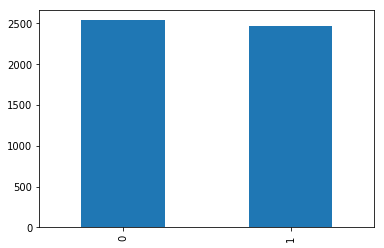

In [199]:
imdb_df.sentiment.value_counts().plot(kind='bar')

In [12]:
## Clean the movie overview text
def text_preprocess(sentence):
    # convert text to lowercase
    sentence=str(sentence)
    sentence = sentence.lower()
    
    # A tokenizer that splits a string using a regular expression, which matches either the tokens or the separators between tokens.
    tokenizer = nltk.RegexpTokenizer(r'\w+')
    tokens = tokenizer.tokenize(sentence) 

    # Remove stopwords
    filtered_words = [w for w in tokens if len(w) > 2 if not w in stopwords.words('english')]

    # Stemming the words (eg. Studies => Studi)
    stemmer = PorterStemmer()
    stem_words=[stemmer.stem(w) for w in filtered_words]

    # Lemmatize (eg. Studies => Study)
    lemmatizer = WordNetLemmatizer()
    lemma_words=[lemmatizer.lemmatize(w) for w in stem_words]
    
    return " ".join(filtered_words)

    # Check & remove numbers
    self.data.tokens = self.data.tokens.map(lambda x: check_num(x))

In [6]:
imdb_df3['clean_review'] = imdb_df3['review'].apply(text_preprocess)
imdb_df3.head()

,review,sentiment,clean_review
0,One of the other reviewers has mentioned that after watching just 1 Oz episode you'll be hooked....,positive,one reviewers mentioned watching episode hooked right exactly happened first thing struck brutal...
1,A wonderful little production. <br /><br />The filming technique is very unassuming- very old-ti...,positive,wonderful little production filming technique unassuming old time bbc fashion gives comforting s...
2,"I thought this was a wonderful way to spend time on a too hot summer weekend, sitting in the air...",positive,thought wonderful way spend time hot summer weekend sitting air conditioned theater watching lig...
3,Basically there's a family where a little boy (Jake) thinks there's a zombie in his closet & his...,negative,basically family little boy jake thinks zombie closet parents fighting time movie slower soap op...
4,"Petter Mattei's ""Love in the Time of Money"" is a visually stunning film to watch. Mr. Mattei off...",positive,petter mattei love time money visually stunning film watch mattei offers vivid portrait human re...


In [69]:
imdb_df3.to_excel('reports/imdb_df_clean_reviews.xlsx')

In [190]:
imdb_df3['clean_review'][0]

'one reviewers mentioned watching episode hooked right exactly happened first thing struck brutality unflinching scenes violence set right word trust show faint hearted timid show pulls punches regards drugs sex violence hardcore classic use word called nickname given oswald maximum security state penitentary focuses mainly emerald city experimental section prison cells glass fronts face inwards privacy high agenda city home many aryans muslims gangstas latinos christians italians irish scuffles death stares dodgy dealings shady agreements never far away would say main appeal show due fact goes shows dare forget pretty pictures painted mainstream audiences forget charm forget romance mess around first episode ever saw struck nasty surreal say ready watched developed taste got accustomed high levels graphic violence violence injustice crooked guards sold nickel inmates kill order get away well mannered middle class inmates turned prison bitches due lack street skills prison experience w

In [45]:
# imdb_df3['sentiment'] = imdb_df3['sentiment'].apply(lambda x: 1 if x == 'positive' else 0)

### <font color = 'green'> Split the dataset

In [46]:
X=list(imdb_df3['clean_review'])
y=list(imdb_df3['sentiment'])

In [47]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42,stratify=y)

In [48]:
X_train[:5]

['indeed film popularized kung 1970s however ever kind excitement even halfway interesting plot seem aged well long story short extremely drawn slow moving confusing plot run mill choreography typically annoying exaggerated whiplash sounds every punch kick constant plot twists never come end time film reaches emotional climax long wind knocked actually care watch historical value milestone chinese kung cinema leave expectations door bitterly disappointed hardcore fans',
 'snakes train movie rented due pure amusement thoughts movie snakes plane enjoyable action film obviously film makers wanted cash success low budget effort minutes snakes train almost unbearable witness keep pausing film something entertain due lack happenings film throughout duration film never fully explained girl curse keeps coughing green purplish goo constantly endless boring dialog two main characters brujo alma discussing get rid curse appreciate low budget film making truly picky movies open genre budget snakes

In [49]:
y_train[:10]

[0, 0, 0, 1, 1, 1, 1, 1, 1, 1]

In [50]:
X_test

['lcdr tom dodge despite reputation among submariners renegade maverick note reader maverick mean tom cruise maverick means non conformist actually intelligence operative vice admiral submarine fleet vice admiral concerned old friends russians hosting yard sales old diesel fleets countries like lybia north korea iraq would love get hands baby slip nuclear warhead norfolk harbour mayport florida years admiral assigns dodge assume command moth balled wwii diesel sub mount exercise surface fleet uss orlando top line fast attack sub dodge takes command time whips bad news bears err mean lovable group oddball submariners warriors despite welcome aboard tattooed penis competent fair commander choose favorites delegates authority responsible manner navy could come finer piece recruitment propaganda handsomely made appreciated gem creator police academy',
 'film laboured along predictable story lines shallow characters ever seen writer obviously bought playbook write space disaster movie follo

In [51]:
y_test

[1,
 0,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 1,
 1,
 1,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 1,
 0,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 0,
 0,
 1,
 0,
 0,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 0,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,
 1,
 0,


### <font color = 'green'> Tokenize data for model input
    
The DistilBertTokenizer accepts text of type “str” (single example),
“List[str]” (batch or single pretokenized example), or “List[List[str]]” (batch of pretokenized examples).
Maximally supported tokenized sentence length in DistilBERT is 512 words.

The tokenizer fills by zeroes up to max tokenized sentence length.

The Stanford Sentiment Treebank is a corpus with fully labeled parse trees that allows for a complete analysis of the compositional effects of sentiment in language.
The corpus is based on the dataset introduced by Pang and Lee (2005) and consists of 11,855 single sentences extracted from movie reviews. 

In [21]:
MODEL_NAME_01 = 'distilbert-base-uncased'
MODEL_NAME_02 = 'distilbert-base-uncased-finetuned-sst-2-english'

tokenizer = DistilBertTokenizerFast.from_pretrained(MODEL_NAME_01)
# tokenizer = DistilBertTokenizerFast.from_pretrained(MODEL_NAME_02)

To preprocess the input text data, the first thing we will have to do is to add the [CLS] token at the beginning,
and the [SEP] token at the end of each input text.

For tokens not appearing in the original vocabulary, it is designed that they should be replaced with a special token [UNK], which stands for unknown token.

[SEP] is for separating sentences for the next sentence prediction task

[PAD] is used to represent paddings to the sentence.

In [57]:
train_encodings = tokenizer(X_train,
                            truncation=True,
                            padding=True)

test_encodings = tokenizer(X_test,
                           truncation=True,
                           padding=True)

In [58]:
train_encodings

{'input_ids': [[101, 5262, 2143, 20339, 18577, 3955, 2174, 2412, 2785, 8277, 2130, 8576, 5875, 5436, 4025, 4793, 2092, 2146, 2466, 2460, 5186, 4567, 4030, 3048, 16801, 5436, 2448, 4971, 16967, 4050, 15703, 16903, 11473, 27067, 4165, 2296, 8595, 5926, 5377, 5436, 21438, 2196, 2272, 2203, 2051, 2143, 6561, 6832, 14463, 2146, 3612, 6573, 2941, 2729, 3422, 3439, 3643, 19199, 2822, 18577, 5988, 2681, 10908, 2341, 19248, 9364, 13076, 4599, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [59]:
len(train_encodings['input_ids'])

4000

In [60]:
len(test_encodings['input_ids'])

1000

In [78]:
test_encodings

{'input_ids': [[101, 10166, 3856, 12635, 11142, 3866, 2728, 18431, 2571, 26937, 3389, 4679, 4499, 11008, 3436, 13352, 2140, 3185, 2895, 7472, 23873, 20014, 27611, 15966, 5870, 3341, 2835, 5791, 2143, 2052, 16755, 2111, 12284, 9414, 7982, 4840, 7339, 4985, 2301, 2143, 2673, 2562, 3407, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

### <font color = 'green'> Turn our labels and encodings into a Tensorflow Dataset object

In [61]:
## Train & test into tensorflow slices
train_dataset = tf.data.Dataset.from_tensor_slices((dict(train_encodings),y_train))

test_dataset = tf.data.Dataset.from_tensor_slices((dict(test_encodings),y_test))

In [65]:
train_dataset.

<TensorSliceDataset element_spec=({'input_ids': TensorSpec(shape=(512,), dtype=tf.int32, name=None), 'attention_mask': TensorSpec(shape=(512,), dtype=tf.int32, name=None)}, TensorSpec(shape=(), dtype=tf.int32, name=None))>

In [62]:
# Set tf.autograph in order to avoid below compile error-
'''
WARNING:tensorflow:AutoGraph could not transform <function Model.make_train_function.<locals>.train_function at 0x00000281A55264C8> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: Bad argument number for Name: 4, expecting 3
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
'''

tf.autograph.set_verbosity(0)


### <font color = 'green'> Fine-tuning with native TensorFlow

In [63]:
# DistilBERT model
model = TFDistilBertForSequenceClassification.from_pretrained(MODEL_NAME_01,
                                                              num_labels=2)

# Define the loss function
loss_fn = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

# Choose the optimizer
optimizer = tf.keras.optimizers.Adam(learning_rate=5e-5, epsilon=1e-08)

Some layers from the model checkpoint at distilbert-base-uncased were not used when initializing TFDistilBertForSequenceClassification: ['vocab_transform', 'activation_13', 'vocab_layer_norm', 'vocab_projector']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFDistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['pre_classifier', 'classifier', 'dropout_159']
You should probably TRAIN this model on a down-stream task to be able to use 

In [64]:
# Build the model
model.compile(optimizer=optimizer,loss=loss_fn,metrics=['accuracy'])

In [65]:
# Train the model
model.fit(train_dataset.shuffle(100).batch(16),
          epochs=1,
          batch_size=16,
          validation_data=test_dataset.shuffle(100).batch(16))

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
250/250 [==============================] - ETA: 0s - loss: 0.4228 - accuracy: 0.8012 WARNING:tensorflow:AutoGraph could not transform <function Model.make_test_function.<locals>.test_function at 0x155ec8840> and will run it as-is.
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
250/250 [==============================] - 5968s 24s/step - loss: 0.4228 - accuracy: 0.8012 - val_loss: 0.2944 - val_accuracy: 0.8730


In [8]:
# Save the model to disk
import pickle
filename_model_01 = 'saved_models/DBert_trained_model_IMDB_reviews_Nov21.sav'
pickle.dump(model, open(filename_model_01, 'wb'))

# load the model from disk
# model = pickle.load(open(filename_model_01, 'rb'))


In [68]:
# Evaluate the model - Model 01
BATCH_SIZE = 16
# model evaluation on the test set
model.evaluate(test_dataset.shuffle(len(X_test)).batch(BATCH_SIZE), 
               return_dict=True, 
               batch_size=BATCH_SIZE)


63/63 [==============================] - 498s 8s/step - loss: 0.2944 - accuracy: 0.8730


{'loss': 0.2943866550922394, 'accuracy': 0.8730000257492065}

In [25]:
# Evaluate the model - Model 01
BATCH_SIZE = 16
# model evaluation on the test set
model.evaluate(test_dataset.shuffle(len(X_test)).batch(BATCH_SIZE), 
               return_dict=True, 
               batch_size=BATCH_SIZE)


In [ ]:
--> {'loss': 0.2943866550922394, 'accuracy': 0.8730000257492065}

### <font color = 'green'> Predict

In [200]:
## Load test data from TMDB
## -- select * from gaby_db.tmdb_corr_genres  limit 5000;

# Load dataset
tmdb_df = pd.read_csv('reports/tmdb_sample_15k.csv')
# tmdb_df.head()
# tmdb_df = pd.read_csv('reports/tmdb_sample.csv')

pred_overviews_df = tmdb_df.copy(deep=True)
pred_overviews_df = pred_overviews_df.head(100)
pred_overviews_df['clean_overview'] = pred_overviews_df['overview'].apply(text_preprocess)
pred_overviews = pred_overviews_df['clean_overview'].tolist()
# pred_overviews

In [314]:
pred_overviews_df.genre.unique()

array(['Comedy', 'Action', 'Talk-show', 'Drama', 'Documentary', 'Family',
       'Reality', 'Animation', 'Crime', 'Science fiction'], dtype=object)

In [201]:
## Predictions
tf_batch = tokenizer(pred_overviews, 
                     max_length=128,
                     padding=True,
                     truncation=True,
                     return_tensors='tf')  # we are tokenizing before sending into our trained model

tf_outputs = model(tf_batch)                                  
tf_predictions = tf.nn.softmax(tf_outputs[0], axis=-1)       # axis=-1, this means that the index that will be returned by argmax will be taken from the *last* axis.
labels = ['Negative','Positive']
label = tf.argmax(tf_predictions, axis=1) #--> check for polarity score
label = label.numpy()

In [177]:
label
# for i in range(len(pred_overviews)):
#     print(pred_overviews[i], ": ", labels[label[i]], '\n\n')

array([1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1,
       1, 1, 0])

In [178]:
type(label)

numpy.ndarray

In [202]:
sent = {1:"Positive", 0:"Negative"}
pred_overviews_df['sentiment'] = label.tolist()
pred_overviews_df['sentiment'] = pred_overviews_df['sentiment'].map(sent)
pred_overviews_df

,show_name,genre,show_date,overview,clean_overview,sentiment
0,0 with Michael Shchur,Comedy,2021-12-19,Weekly satirical news digest with host Roman Vintoniv as Michael Schur,weekly satirical news digest host roman vintoniv michael schur,Positive
1,0091,Action,2006-12-21,In an alternate world the Cold War has continued to persist for 140 years As a result the world ...,alternate world cold war continued persist 140 years result world divided two factions west bloc...,Positive
2,0137,Talk-show,1991-02-28,0137 was a livebroadcast german talk show,0137 livebroadcast german talk show,Positive
3,07 zgo si,Drama,1987-04-26,The series centres around the investigations of Police Lieutenant Sawomir Borewicz Each episode ...,series centres around investigations police lieutenant sawomir borewicz episode features differe...,Positive
4,07Ghost,Documentary,2009-09-22,Set in a gothic fantasy world this is the story of Teito Klein an orphaned slave who became the ...,set gothic fantasy world story teito klein orphaned slave became top military academy student ho...,Negative
...,...,...,...,...,...,...
95,12 OClock High,Drama,1967-01-13,this series chronicles the adventuresin the air and on the groundof the men of the 918th bombard...,series chronicles adventuresin air groundof men 918th bombardment group eighth air force first c...,Positive
96,12 Puppies And Us,Documentary,2020-12-17,weve always been a nation of dog lovers but this year our infatuation has moved up a gear the co...,weve always nation dog lovers year infatuation moved gear covid19 pandemic led boom dog ownershi...,Positive
97,12 Rei,Drama,2020-12-26,A young lawyer with a problematic past got a job in the office of a wellknown Belgrade lawyer He...,young lawyer problematic past got job office wellknown belgrade lawyer becomes defense attorney ...,Positive
98,12 Years Promise,Reality,2014-06-29,A pregnant teen is forced by her family to leave her boyfriend and assume a new identity in Amer...,pregnant teen forced family leave boyfriend assume new identity america years later couple reuni...,Positive


In [204]:
# pred_overviews_df.to_excel('predicted_sentiments.xlsx',index=False)

In [213]:
pred_overviews_df[pred_overviews_df['sentiment']=='Negative'].genre.value_counts()

Drama          8
Comedy         6
Documentary    3
Crime          1
Family         1
Reality        1
Name: genre, dtype: int64

In [306]:
tf_predictions_arr = np.array(tf_predictions)
tf_predictions_arr

array([[0.22452632, 0.7754737 ],
       [0.47204888, 0.52795106],
       [0.28709334, 0.71290666],
       [0.14656764, 0.8534324 ],
       [0.59520245, 0.40479755],
       [0.44784802, 0.5521519 ],
       [0.87340164, 0.12659833],
       [0.58488166, 0.4151183 ],
       [0.4256426 , 0.5743574 ],
       [0.06196012, 0.93803984],
       [0.0226875 , 0.97731245],
       [0.04405335, 0.9559467 ],
       [0.06408571, 0.9359143 ],
       [0.00124279, 0.99875724],
       [0.01090904, 0.989091  ],
       [0.12246054, 0.8775395 ],
       [0.01648832, 0.9835117 ],
       [0.8916854 , 0.10831457],
       [0.45464662, 0.5453534 ],
       [0.18681976, 0.81318027],
       [0.08315146, 0.9168486 ],
       [0.01470964, 0.9852903 ],
       [0.19233619, 0.8076638 ],
       [0.39784393, 0.6021561 ],
       [0.71412575, 0.2858743 ],
       [0.7701931 , 0.2298069 ],
       [0.0511801 , 0.94881994],
       [0.3053649 , 0.6946351 ],
       [0.87209016, 0.12790988],
       [0.00540516, 0.9945949 ],
       [0.

In [227]:
score_arr =[]
for x in test:
    score_arr.append(max(x))

In [228]:
score_arr

[0.7754737,
 0.52795106,
 0.71290666,
 0.8534324,
 0.59520245,
 0.5521519,
 0.87340164,
 0.58488166,
 0.5743574,
 0.93803984,
 0.97731245,
 0.9559467,
 0.9359143,
 0.99875724,
 0.989091,
 0.8775395,
 0.9835117,
 0.8916854,
 0.5453534,
 0.81318027,
 0.9168486,
 0.9852903,
 0.8076638,
 0.6021561,
 0.71412575,
 0.7701931,
 0.94881994,
 0.6946351,
 0.87209016,
 0.9945949,
 0.70887244,
 0.98044807,
 0.8617504,
 0.84391934,
 0.63303417,
 0.9855605,
 0.81024694,
 0.8797007,
 0.98079014,
 0.7456784,
 0.94473964,
 0.9964611,
 0.5250283,
 0.9866688,
 0.9772818,
 0.98354894,
 0.9933201,
 0.79583186,
 0.914414,
 0.99877363,
 0.94836265,
 0.8789075,
 0.8238632,
 0.9875888,
 0.77335256,
 0.86981606,
 0.95851445,
 0.972059,
 0.61036736,
 0.96606666,
 0.98560274,
 0.7096312,
 0.92301106,
 0.84361494,
 0.9854063,
 0.8784258,
 0.5956078,
 0.98709536,
 0.65368104,
 0.8772294,
 0.93091136,
 0.88207054,
 0.772871,
 0.5981699,
 0.9871611,
 0.84739244,
 0.63753504,
 0.96590424,
 0.9665544,
 0.58873606,
 0.99

In [229]:
pred_overviews_df['sentiment_score'] = score_arr
pred_overviews_df

,show_name,genre,show_date,overview,clean_overview,sentiment,sentiment_score
0,0 with Michael Shchur,Comedy,2021-12-19,Weekly satirical news digest with host Roman Vintoniv as Michael Schur,weekly satirical news digest host roman vintoniv michael schur,Positive,0.775474
1,0091,Action,2006-12-21,In an alternate world the Cold War has continued to persist for 140 years As a result the world ...,alternate world cold war continued persist 140 years result world divided two factions west bloc...,Positive,0.527951
2,0137,Talk-show,1991-02-28,0137 was a livebroadcast german talk show,0137 livebroadcast german talk show,Positive,0.712907
3,07 zgo si,Drama,1987-04-26,The series centres around the investigations of Police Lieutenant Sawomir Borewicz Each episode ...,series centres around investigations police lieutenant sawomir borewicz episode features differe...,Positive,0.853432
4,07Ghost,Documentary,2009-09-22,Set in a gothic fantasy world this is the story of Teito Klein an orphaned slave who became the ...,set gothic fantasy world story teito klein orphaned slave became top military academy student ho...,Negative,0.595202
...,...,...,...,...,...,...,...
95,12 OClock High,Drama,1967-01-13,this series chronicles the adventuresin the air and on the groundof the men of the 918th bombard...,series chronicles adventuresin air groundof men 918th bombardment group eighth air force first c...,Positive,0.690803
96,12 Puppies And Us,Documentary,2020-12-17,weve always been a nation of dog lovers but this year our infatuation has moved up a gear the co...,weve always nation dog lovers year infatuation moved gear covid19 pandemic led boom dog ownershi...,Positive,0.992707
97,12 Rei,Drama,2020-12-26,A young lawyer with a problematic past got a job in the office of a wellknown Belgrade lawyer He...,young lawyer problematic past got job office wellknown belgrade lawyer becomes defense attorney ...,Positive,0.518512
98,12 Years Promise,Reality,2014-06-29,A pregnant teen is forced by her family to leave her boyfriend and assume a new identity in Amer...,pregnant teen forced family leave boyfriend assume new identity america years later couple reuni...,Positive,0.897960


In [ ]:
## The model is able to predict positive/negative sentiments based on Movie/TV Show overviews.